In [57]:
import numpy as np
import scipy
import scipy.stats
import pandas as pd
import astropy.units as u
import sunpy.map
import sunpy.visualization.colormaps as cm
import sunpy.data.sample
import reproject
import cv2
from sklearn.cluster import KMeans
from PIL import Image
from copy import copy
import datetime

import cv2

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import seaborn as sns
import seaborn_image as isns
sns.set_style("darkgrid")

import os

import glob
import random

import utils

%matplotlib inline

In [46]:
data_dir = "/mnt/disk2/downloads/hmi/hmi/"
test_file = os.listdir(data_dir)[0]
print(test_file)


hmi_m_45s_2011_06_01_03_01_30_tai_magnetogram.fits


'2011_06_01_03_01_30'

Observatory,SDO
Instrument,HMI FRONT2
Detector,HMI
Measurement,magnetogram
Wavelength,6173.0
Observation Date,2011-06-01 03:00:40
Exposure Time,Unknown
Dimension,[4096. 4096.] pix
Coordinate System,helioprojective
Scale,[0.504278 0.504278] arcsec / pix
Reference Pixel,[2039.813965 2047.567383] pix

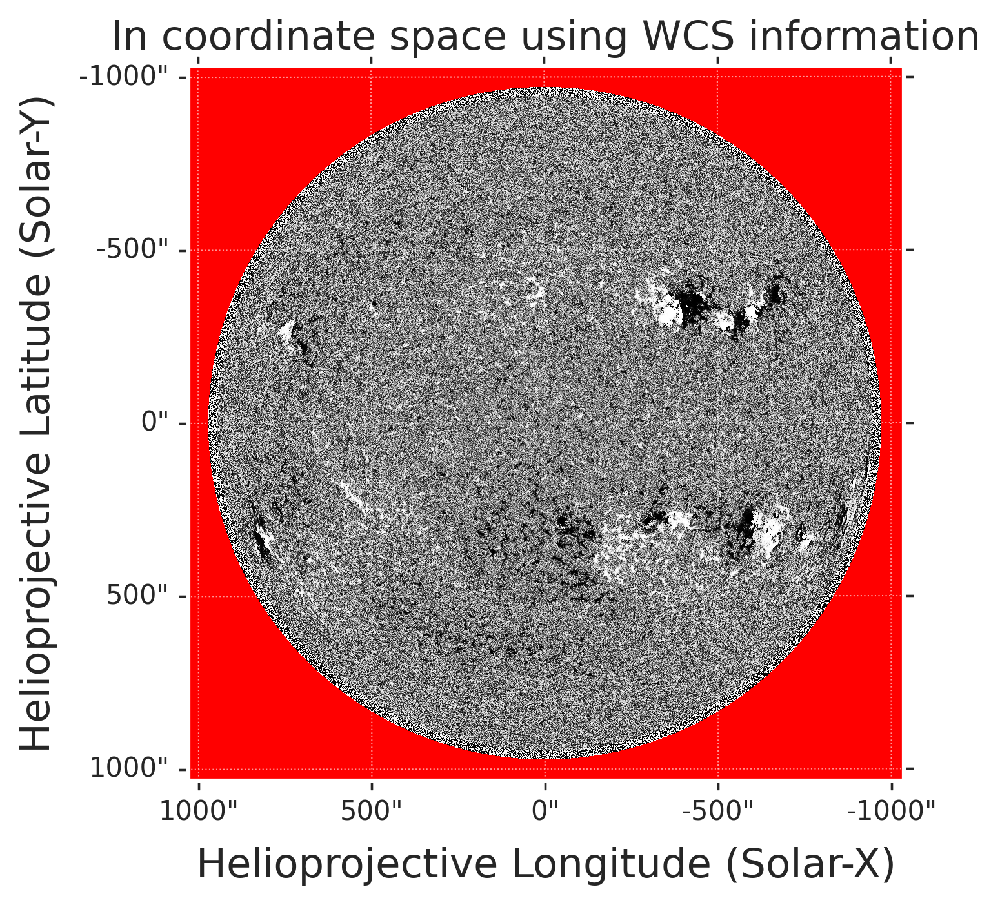
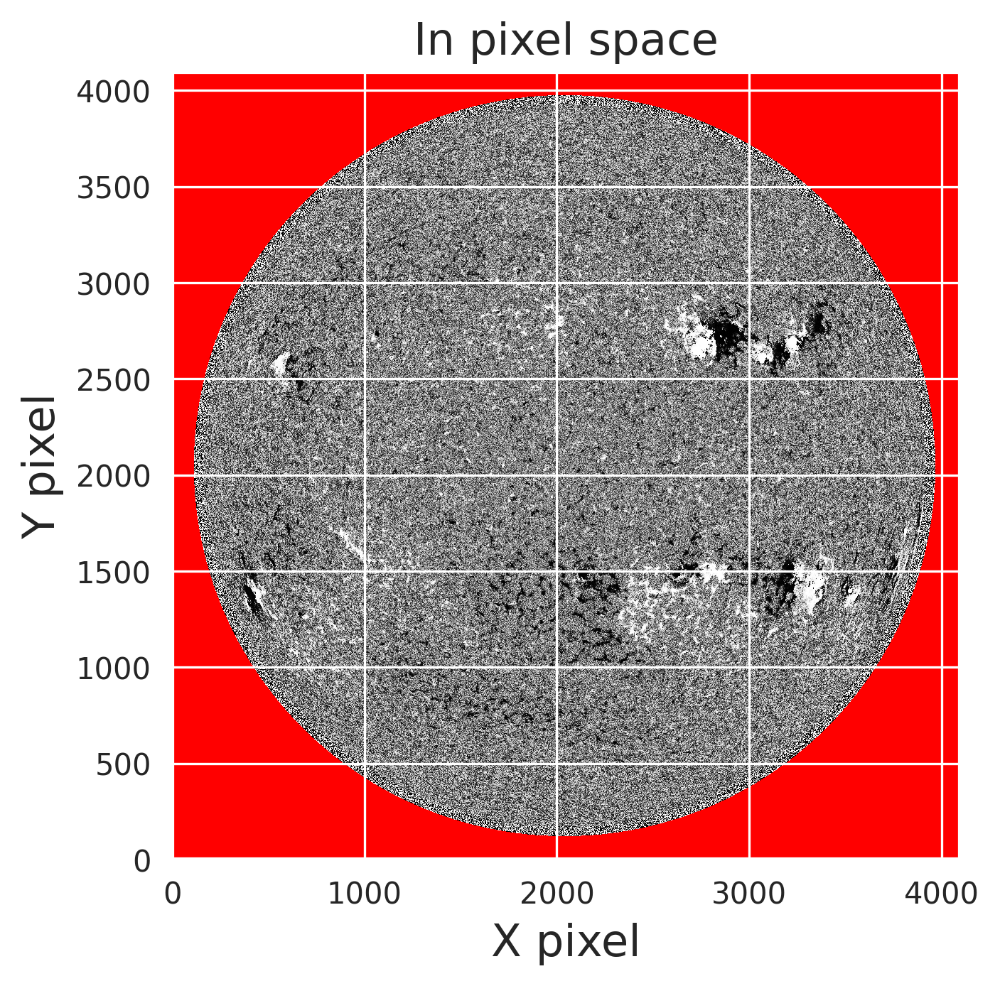
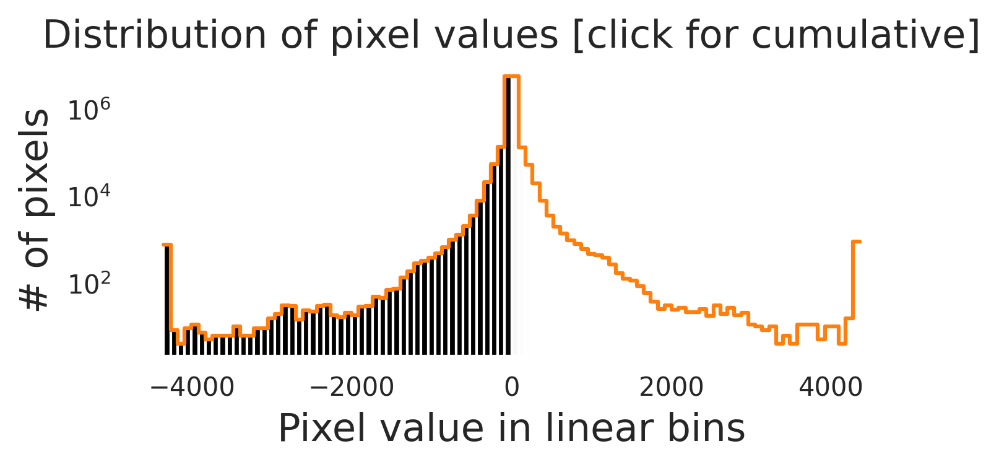
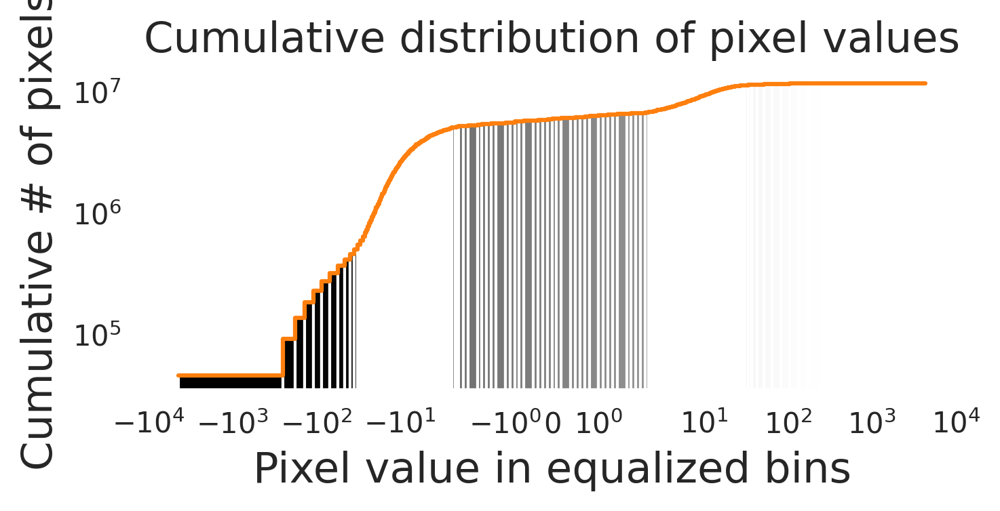

In [4]:
HMI_datapoint = sunpy.map.Map(data_dir + test_file)
HMI_datapoint

Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

AIA20110607_063307_0193_lowres.fits:   0%|          | 0.00/1.00M [00:00<?, ?B/s]

Observatory,SDO
Instrument,AIA 2
Detector,AIA
Measurement,193.0 Angstrom
Wavelength,193.0 Angstrom
Observation Date,2011-06-07 06:33:07
Exposure Time,1.999683 s
Dimension,[1024. 1024.] pix
Coordinate System,helioprojective
Scale,[2.403032 2.403032] arcsec / pix
Reference Pixel,[511.5 511.5] pix

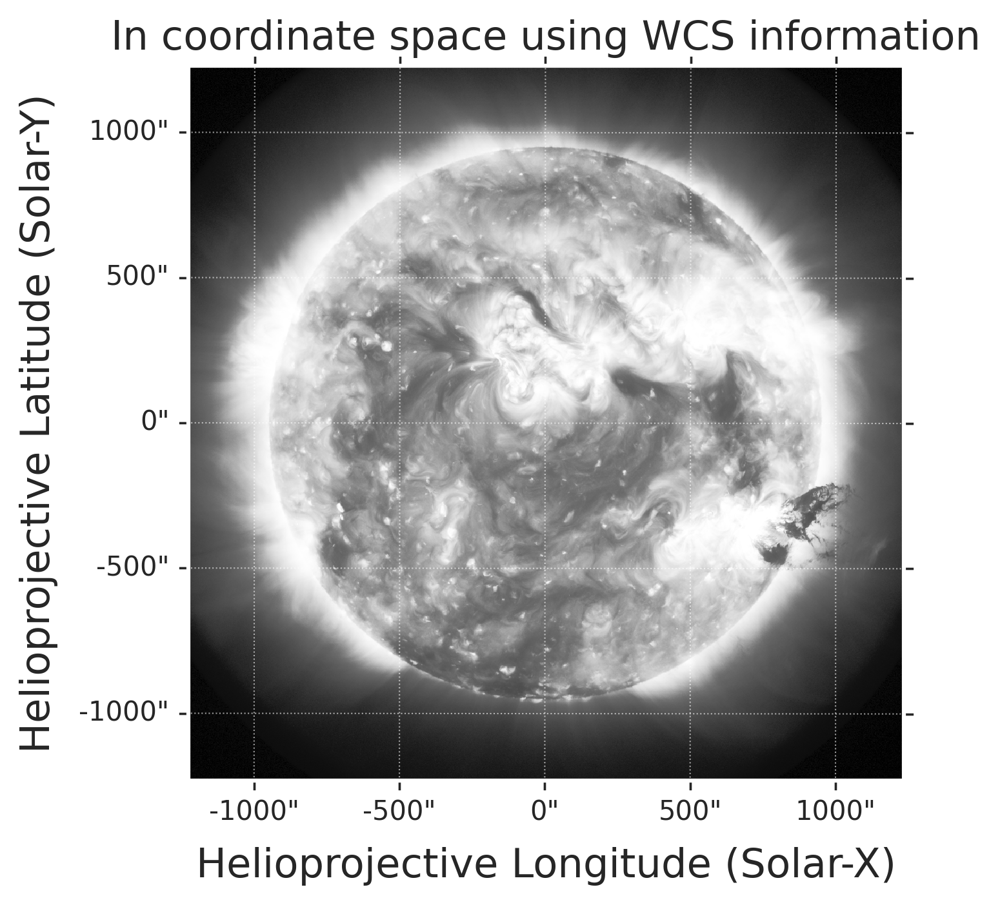
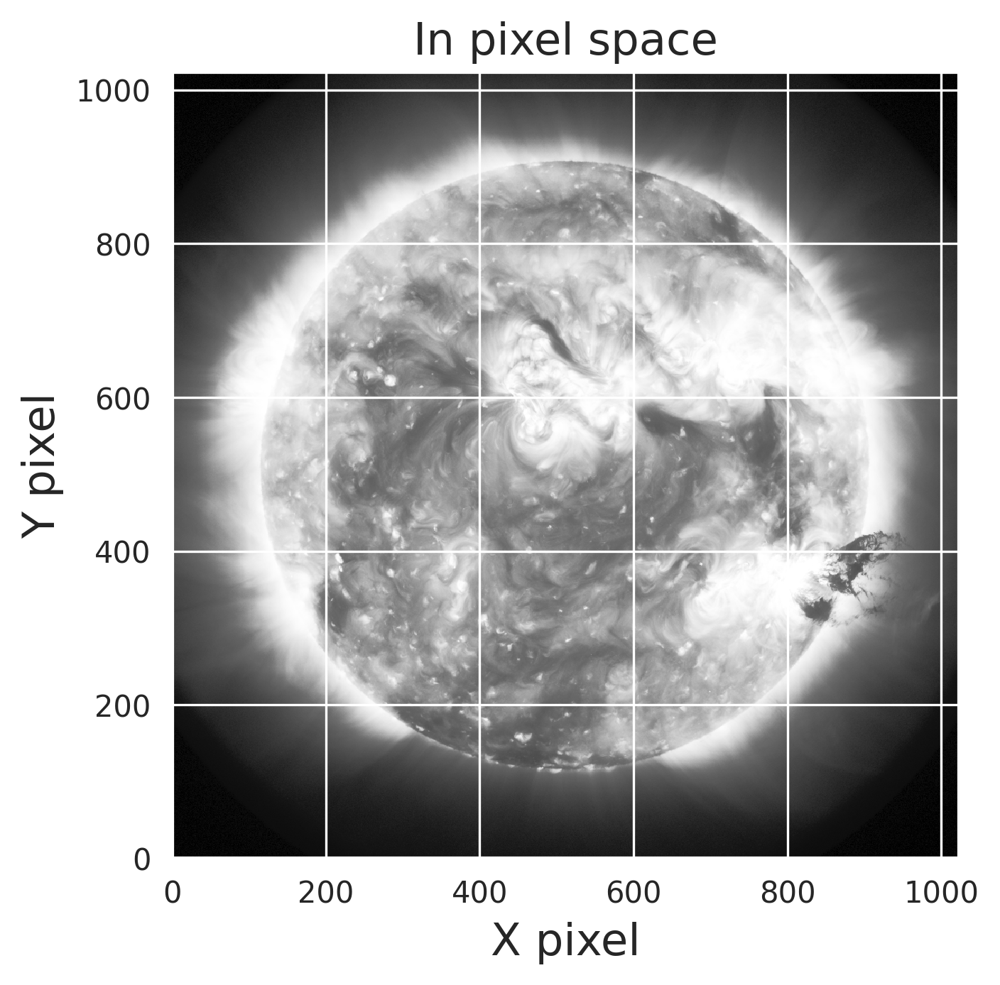
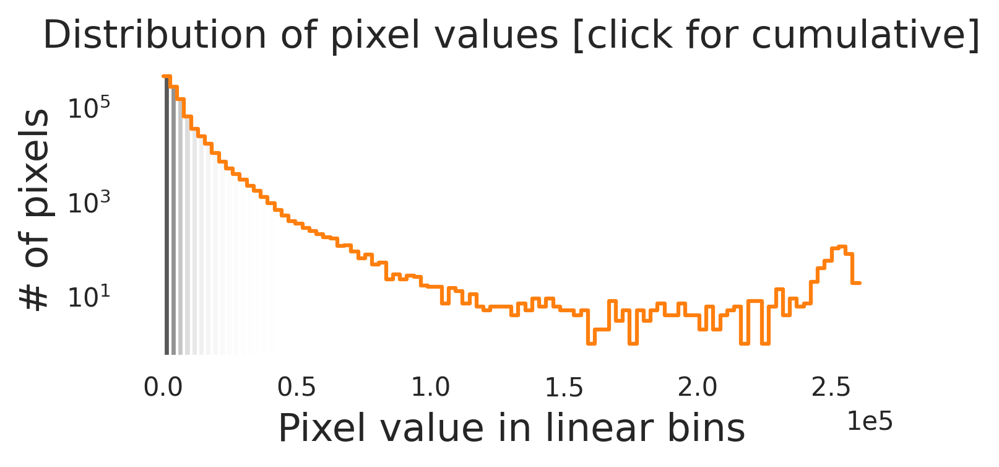
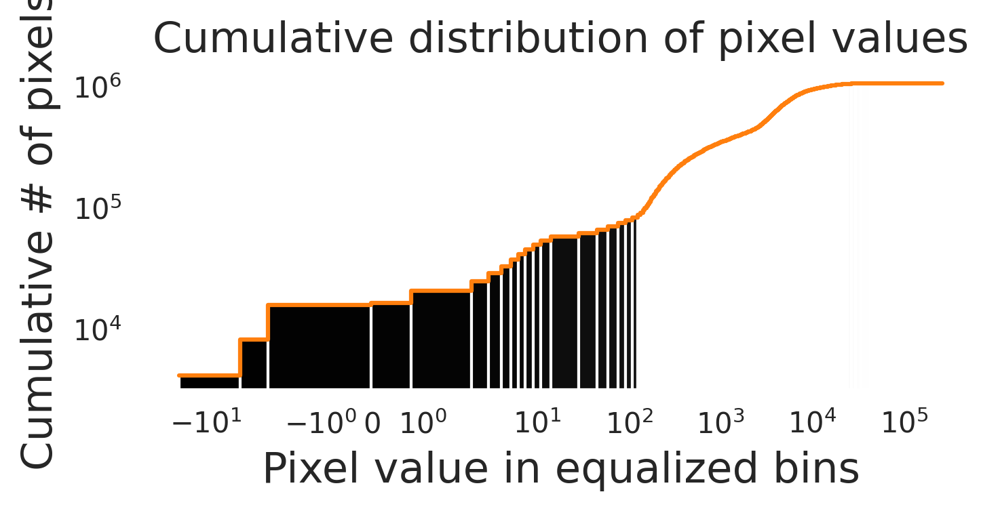

In [40]:
reference_AIA = sunpy.map.Map(sunpy.data.sample.AIA_193_IMAGE)
reference_AIA

Observatory,
Instrument,
Detector,
Measurement,Unknown
Wavelength,Unknown
Observation Date,2011-06-07 06:33:07
Exposure Time,Unknown
Dimension,[1024. 1024.] pix
Coordinate System,helioprojective
Scale,[0.00066751 0.00066751] deg / pix
Reference Pixel,[511.5 511.5] pix

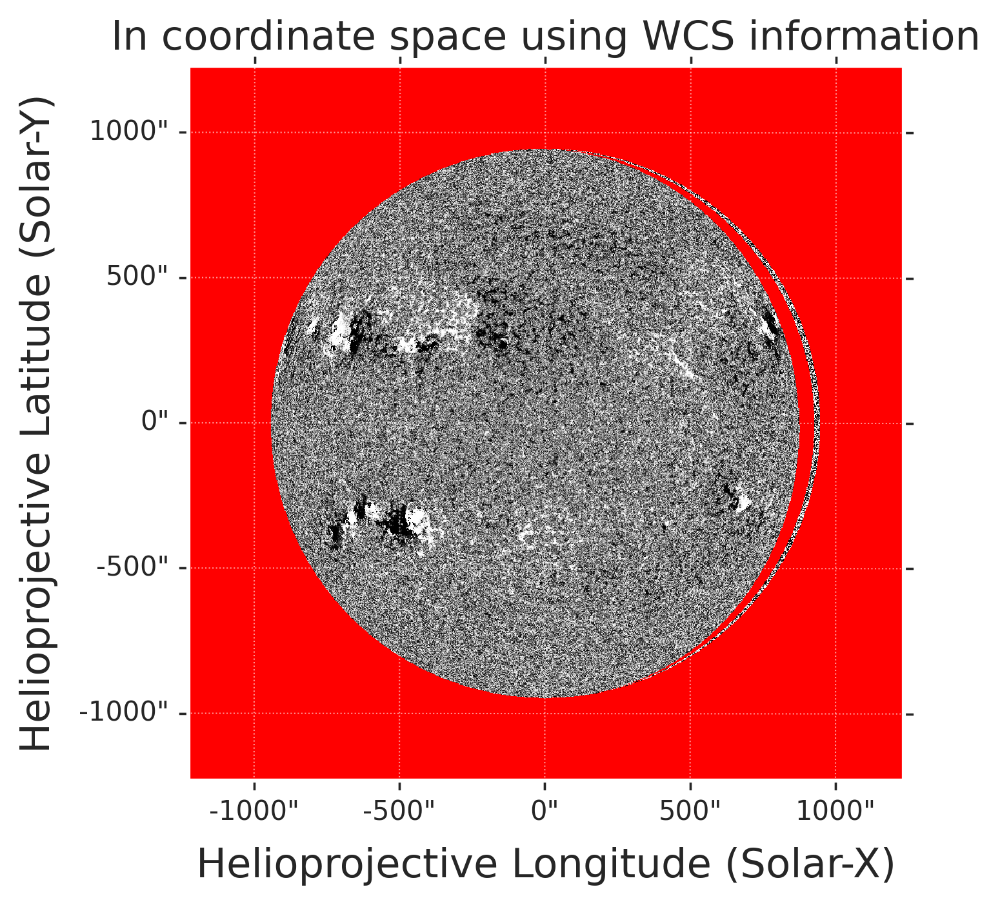
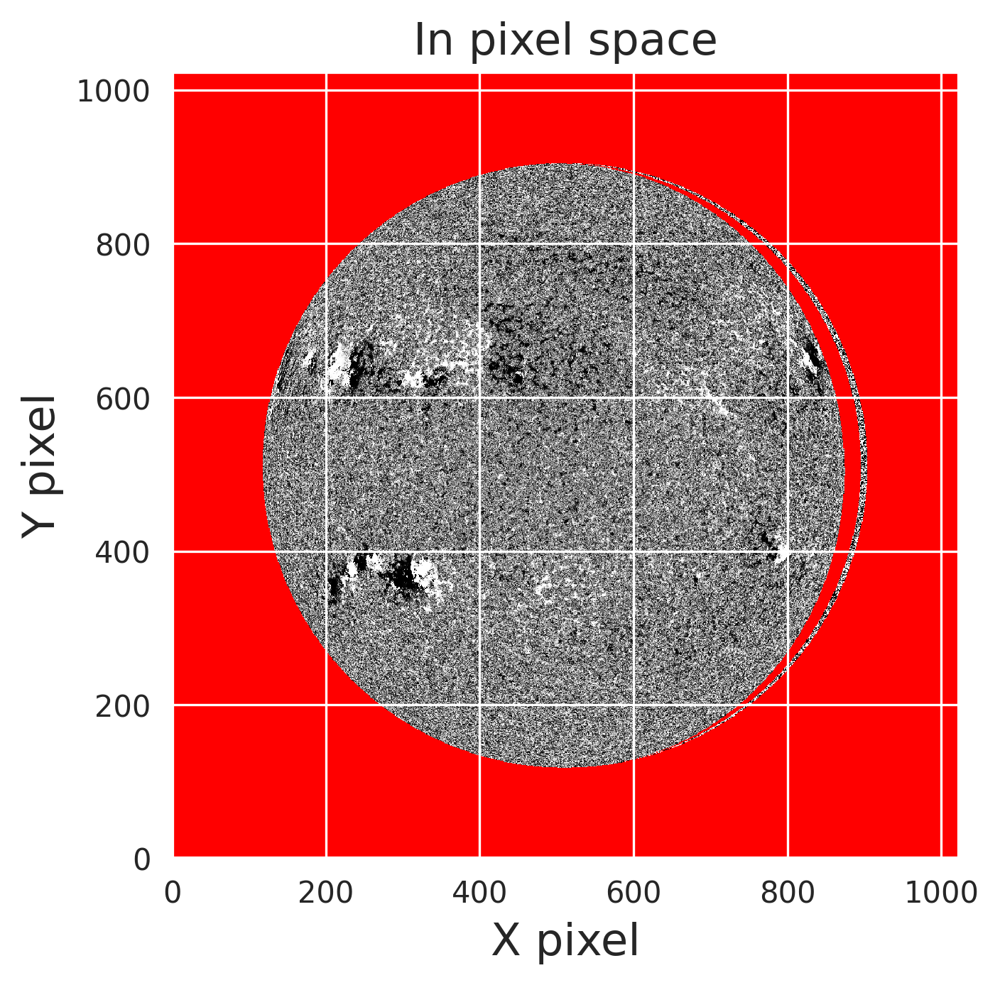
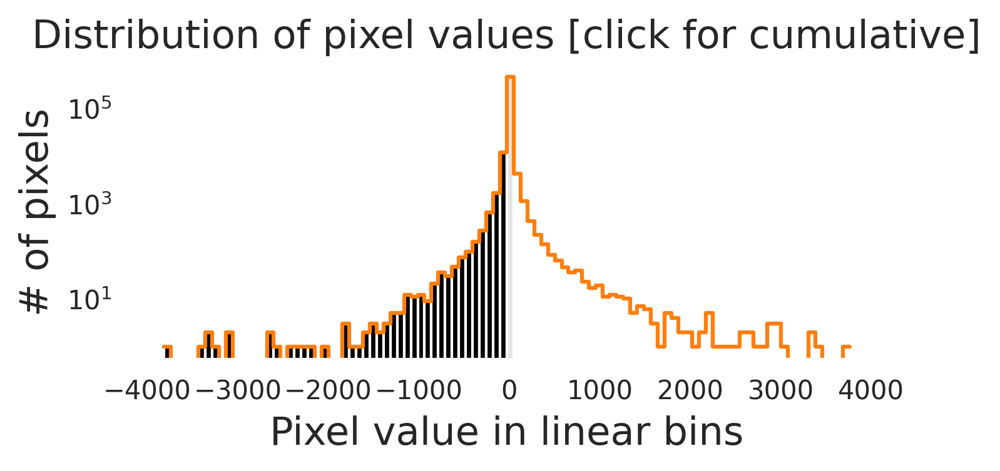
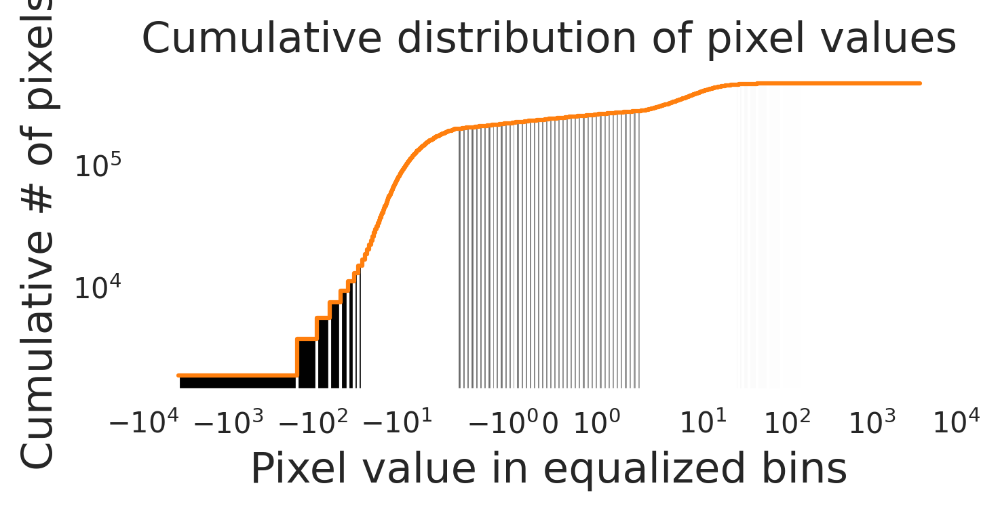

In [42]:
HMI_datapoint.reproject_to(reference_AIA.wcs)

In [ ]:
HMI_datapoint.resample([256,256]*u.pixel)

In [8]:
print(type(HMI_datapoint))
HMI_proj = reproject.reproject_exact(HMI_datapoint, reference_AIA.wcs, [256,256])
HMI_proj

<class 'sunpy.map.sources.sdo.HMIMap'>


(array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]))

In [9]:
HMI_datamat = HMI_dp_out.data
HMI_datamat[np.isnan(HMI_datamat)] = 0
HMI_datamat_small = cv2.resize(HMI_datamat, [256, 256], interpolation = cv2.INTER_NEAREST)
isns.imshow(HMI_datamat_small, cmap="RdGy", vmin=-30, vmax=30)

NameError: name 'HMI_dp_out' is not defined

In [112]:
aia_ref_file_names = os.listdir("data/aia_193A/")
aia_date_format = "%Y-%m-%dT%H-%M-%S.fits"
aia_ref_dates = [datetime.datetime.strptime(i, aia_date_format) for i in aia_ref_file]

aia_earliest = min(aia_ref_dates)
aia_latest = max(aia_ref_dates)
print(aia_earliest, aia_latest)

corrupted_idx = [1655, 10417, 17434, 17435, 17437, 25225]

hmi_date_format = "hmi_m_45s_%Y_%m_%d_%H_%M_%S_tai_magnetogram.fits"
output_file_format = "%Y-%m-%dT%H-%M-%S.fits"
for idx, val in enumerate(os.listdir("/mnt/disk2/downloads/hmi/hmi/")):
    hmi_date = datetime.datetime.strptime(val, hmi_date_format)

    if os.path.exists("data/hmi_magnetogram/" + hmi_date.strftime("%Y-%m-%dT%H-%M-%S.fits")):
        print(f"file {hmi_date.strftime('%Y-%m-%dT%H-%M-%S.fits')} already exists")

    elif hmi_date - datetime.timedelta(hours=6) > aia_earliest and idx not in corrupted_idx:
        print(f"AIA {aia_ref_dates[closest_date_idx]} -> HMI {hmi_date}, {idx}")

        date_dist = [abs(hmi_date - ref_date) for ref_date in aia_ref_dates]
        closest_date_idx = date_dist.index(min(date_dist))

        hmi_map = sunpy.map.Map("/mnt/disk2/downloads/hmi/hmi/" + val)
        aia_closest_map = sunpy.map.Map("data/aia_193A/" + aia_ref_file_names[closest_date_idx])

        new_hmi_map = hmi_map.reproject_to(aia_closest_map.wcs)

        new_hmi_map.save("data/hmi_magnetogram/" + hmi_date.strftime("%Y-%m-%dT%H-%M-%S.fits"))

        print(f"saved to {hmi_date.strftime('%Y-%m-%dT%H-%M-%S.fits')}")

2012-09-28 03:30:18 2022-09-13 23:40:00
file 2014-07-14T03-01-30.fits already exists
file 2014-07-14T06-01-30.fits already exists
file 2014-07-14T09-01-30.fits already exists
file 2014-07-14T12-01-30.fits already exists
file 2014-07-14T15-01-30.fits already exists
file 2014-07-14T18-01-30.fits already exists
file 2014-07-14T21-01-30.fits already exists
file 2014-07-15T00-01-30.fits already exists
file 2014-07-15T03-01-30.fits already exists
file 2014-07-15T06-01-30.fits already exists
file 2014-07-15T09-01-30.fits already exists
file 2014-07-15T12-01-30.fits already exists
file 2016-12-24T03-01-30.fits already exists
file 2016-12-24T06-01-30.fits already exists
file 2016-12-24T09-01-30.fits already exists
file 2016-12-24T12-01-30.fits already exists
file 2016-12-24T15-01-30.fits already exists
file 2016-12-24T18-01-30.fits already exists
file 2016-12-24T21-01-30.fits already exists
file 2016-12-25T00-01-30.fits already exists
file 2016-12-25T03-01-30.fits already exists
file 2016-12-25